# Kalpitiya Deforestation Analysis — Improved Pipeline
### Landsat 8 & 9 · Surface Reflectance · 2016 to 2025

**Improvements over previous version:**
| Fix | Description |
|---|---|
| Complete cells | All helper functions fully defined (no truncations) |
| Honest RF accuracy | Cross-scene validation on 3 unseen dates |
| Land mask | Persistent NDWI mask excludes ocean / lagoon pixels |
| Seasonal adjustment | T1/T2 matched to same calendar month |
| Cloud filtering | High-cloud scenes excluded from trend regression |
| Vectorised ops | Transition matrix uses `np.bincount` instead of nested loops |
| Robust IO | Context managers + explicit encodings throughout |
| Selective warnings | Only suppresses known harmless rasterio/numpy messages |

**Six passes, in order:**

| Pass | What happens | Output |
|---|---|---|
| 1 | Cloud-mask + scale + save stacked TIFs | `out/stacked/` |
| 2 | Compute NDVI, NDWI, NDBI, NBR, EVI + build land mask | `out/ndvi/` etc., `out/stats/land_mask.tif` |
| 3 | Train Random Forest (cross-scene validation) | `out/models/` |
| 4 | Classify all scenes (land pixels only) | `out/classmaps/` |
| 5 | Change detection (seasonal-adjusted, land-masked) | `out/change/` |
| 6 | Trend analysis + forecast to 2030 (reliable scenes) | `out/stats/` |

Restart-safe: already-processed TIFs are detected and skipped automatically.



In [1]:
import subprocess, sys

def install_if_missing(pkg, imp=None):
    try:
        __import__(imp or pkg)
    except ImportError:
        print(f"Installing {pkg}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", pkg, "-q"])

for pkg, imp in [
    ("rasterio",    "rasterio"),
    ("scikit-learn","sklearn"),
    ("seaborn",     "seaborn"),
    ("joblib",      "joblib"),
    ("scipy",       "scipy"),
]:
    install_if_missing(pkg, imp)

print("All packages ready.")



All packages ready.


In [2]:
import os, re, gc, json, time, warnings
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import seaborn as sns
import rasterio
from rasterio.enums import Resampling
from scipy import stats as scipy_stats
from scipy.signal import savgol_filter
import joblib

from sklearn.ensemble import RandomForestClassifier, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (accuracy_score, classification_report,
                              confusion_matrix, r2_score, mean_squared_error,
                              cohen_kappa_score)

# Selective warning suppression — keep real errors visible
warnings.filterwarnings("ignore", category=UserWarning,  module="rasterio")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message=".*invalid value encountered.*")
warnings.filterwarnings("ignore", message=".*divide by zero.*")

plt.rcParams.update({
    "font.family":       "DejaVu Sans",
    "font.size":         11,
    "axes.titlesize":    13,
    "figure.dpi":        110,
    "figure.facecolor":  "white",
    "axes.facecolor":    "white",
    "axes.spines.right": False,
    "axes.spines.top":   False,
})

print("Imports complete.")



Imports complete.


In [3]:
# ── Only change these lines ───────────────────────────────────────────────────
RAW_DIR    = "data/raw"
OUT_DIR    = "out"
DOWNSAMPLE = 2          # 1=full res (~1.6 GB/scene), 2=half res, 4=quarter res

# Landsat Collection 2 Level-2 scaling: SR = DN * 0.0000275 + (−0.2)
SCALE  = 0.0000275
OFFSET = -0.2

# QA_PIXEL bit flags (Landsat C2 product guide)
QA_FILL       = 0x0001
QA_DILCLD     = 0x0002
QA_CIRRUS     = 0x0004
QA_CLOUD      = 0x0008
QA_SHADOW     = 0x0010
QA_CLOUD_MASK = QA_FILL | QA_DILCLD | QA_CIRRUS | QA_CLOUD | QA_SHADOW

# Land cover classes
CLASS_NAMES  = {0: "Water", 1: "Vegetation", 2: "Bare Soil", 3: "Built-Up"}
CLASS_COLORS = {-1: "#cccccc", 0: "#2171b5", 1: "#238b45", 2: "#d4a843", 3: "#cb181d"}

VEG_THRESHOLD = 0.25

# Derived constants — do not edit
DOWNSAMPLE    = int(DOWNSAMPLE)
PX_HA         = (30 * DOWNSAMPLE) ** 2 / 10_000   # ha per pixel at chosen res
FEATURE_NAMES = ["B2","B3","B4","B5","B6","B7","NDVI","NDWI","NDBI","NBR","EVI"]

# Create output directories up front
for sub in ["stacked","ndvi","ndwi","ndbi","nbr","evi",
            "classmaps","change","graphs","stats","models"]:
    os.makedirs(os.path.join(OUT_DIR, sub), exist_ok=True)

print(f"RAW_DIR    : {os.path.abspath(RAW_DIR)}")
print(f"OUT_DIR    : {os.path.abspath(OUT_DIR)}")
print(f"DOWNSAMPLE : {DOWNSAMPLE}x  =>  ~{7761//DOWNSAMPLE} x {7611//DOWNSAMPLE} px")
print(f"PX_HA      : {PX_HA:.4f} ha/pixel  ({30*DOWNSAMPLE}m resolution)")



RAW_DIR    : d:\Projects\GitHub\terraShiftSriLanka\data\raw
OUT_DIR    : d:\Projects\GitHub\terraShiftSriLanka\out
DOWNSAMPLE : 2x  =>  ~3880 x 3805 px
PX_HA      : 0.3600 ha/pixel  (60m resolution)


In [4]:

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Helper functions — all defined here so every downstream cell can import them
# without worrying about execution order on kernel restart.
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

def parse_landsat_name(fname):
    """Parse a Landsat Collection 2 filename into a metadata dict."""
    base = os.path.basename(fname)
    m = re.match(
        r"(LC0[89])_L2SP_(\d{6})_(\d{8})_\d{8}_\d{2}_T\d_"
        r"(SR_B[1-7]|QA_PIXEL|QA_RADSAT|SR_QA_AEROSOL)",
        base, re.IGNORECASE
    )
    if not m:
        return None
    acq = m.group(3)
    return {
        "sensor":   m.group(1).upper(),
        "path_row": m.group(2),
        "date":     datetime.strptime(acq, "%Y%m%d"),
        "band":     m.group(4).upper(),
        "label":    f"{acq[:4]}_{acq[4:6]}",
    }


def discover_scenes(raw_dir):
    """Build a catalogue of Landsat band file-paths from a directory tree."""
    raw_path = Path(raw_dir)
    if not raw_path.exists():
        raise FileNotFoundError(f"Raw data directory not found: {raw_dir}")
    scenes = {}
    for folder in sorted(raw_path.iterdir()):
        if not folder.is_dir():
            continue
        tifs = sorted(list(folder.glob("*.TIF")) + list(folder.glob("*.tif")))
        if not tifs:
            print(f"  {folder.name}: no TIF files — skipping")
            continue
        entry = {}
        first_info = None
        for tif in tifs:
            info = parse_landsat_name(tif.name)
            if info:
                entry[info["band"]] = str(tif)
                if first_info is None:
                    first_info = info
        if not entry or first_info is None:
            print(f"  {folder.name}: no Landsat-named TIFs — skipping")
            continue
        entry["_meta"] = {
            "sensor":   first_info["sensor"],
            "date":     first_info["date"],
            "label":    first_info["label"],
            "path_row": first_info["path_row"],
        }
        scenes[first_info["label"]] = entry
    return scenes


def load_band(path, downsample=1):
    """Load one SR band, scale to surface reflectance, return (array, profile)."""
    with rasterio.open(path) as src:
        if downsample == 1:
            arr     = src.read(1).astype(np.float32)
            profile = src.profile.copy()
        else:
            out_h = src.height // downsample
            out_w = src.width  // downsample
            arr   = src.read(
                1, out_shape=(out_h, out_w),
                resampling=Resampling.bilinear
            ).astype(np.float32)
            new_t   = src.transform * src.transform.scale(
                src.width / out_w, src.height / out_h
            )
            profile = src.profile.copy()
            profile.update(height=out_h, width=out_w, transform=new_t)
        nodata = src.nodata
    if nodata is not None:
        arr[arr == nodata] = np.nan
    arr = np.clip(arr * SCALE + OFFSET, 0.0, 1.0)
    return arr, profile


def load_qa(path, downsample=1):
    """Load QA_PIXEL band, return boolean mask — True = bad pixel.
    Uses nearest-neighbour resampling so bit flags are never interpolated."""
    with rasterio.open(path) as src:
        if downsample == 1:
            qa = src.read(1).astype(np.uint16)
        else:
            out_h = src.height // downsample
            out_w = src.width  // downsample
            qa = src.read(
                1, out_shape=(out_h, out_w),
                resampling=Resampling.nearest
            ).astype(np.uint16)
    return (qa & QA_CLOUD_MASK) != 0


def save_raster(arr, profile, out_path):
    """Write a 2-D float32 array as a single-band LZW-compressed GeoTIFF."""
    os.makedirs(os.path.dirname(os.path.abspath(out_path)), exist_ok=True)
    p = profile.copy()
    p.update(count=1, dtype="float32", compress="lzw",
             nodata=float("nan"), BIGTIFF="YES")
    with rasterio.open(out_path, "w", **p) as dst:
        dst.write(arr[np.newaxis, :, :])


def pct_stretch(band, pct_lo=2, pct_hi=98):
    """Percentile contrast stretch for RGB visualisation; returns float32 [0,1]."""
    valid = band[~np.isnan(band)]
    if len(valid) == 0:
        return np.zeros_like(band, dtype=np.float32)
    lo, hi = np.percentile(valid, [pct_lo, pct_hi])
    if hi == lo:
        return np.zeros_like(band, dtype=np.float32)
    return np.clip((band - lo) / (hi - lo), 0.0, 1.0).astype(np.float32)


def read_index_tif(label, index_name):
    """Load a pre-computed single-band spectral index TIF."""
    path = f"{OUT_DIR}/{index_name}/{label}_{index_name}.tif"
    with rasterio.open(path) as src:
        return src.read(1).astype(np.float32)


def safe_ratio(a, b):
    """Normalised difference (a-b)/(a+b) with NaN where denominator ~ 0."""
    a = a.astype(np.float32)
    b = b.astype(np.float32)
    with np.errstate(invalid="ignore", divide="ignore"):
        denom  = a + b
        result = np.where(np.abs(denom) > 1e-9, (a - b) / denom, np.nan)
    return result.astype(np.float32)


def compute_indices(stack):
    """
    Compute spectral indices from a 7-band Landsat stack.

    Band order (0-based):
      0=B1  1=B2(Blue)  2=B3(Green)  3=B4(Red)
      4=B5(NIR)  5=B6(SWIR1)  6=B7(SWIR2)

    Returns dict: ndvi, ndwi, ndbi, nbr, evi
    """
    blue  = stack[1];  green = stack[2];  red   = stack[3]
    nir   = stack[4];  swir1 = stack[5];  swir2 = stack[6]

    ndvi = np.clip(safe_ratio(nir,   red),   -1.0, 1.0)
    ndwi = np.clip(safe_ratio(green, nir),   -1.0, 1.0)
    ndbi = np.clip(safe_ratio(swir1, nir),   -1.0, 1.0)
    nbr  = np.clip(safe_ratio(nir,   swir2), -1.0, 1.0)

    # EVI = 2.5 * (NIR - Red) / (NIR + 6*Red - 7.5*Blue + 1)
    with np.errstate(invalid="ignore", divide="ignore"):
        d_evi = (nir.astype(np.float32)
                 + 6.0  * red.astype(np.float32)
                 - 7.5  * blue.astype(np.float32)
                 + 1.0)
        evi = np.where(
            np.abs(d_evi) > 1e-9,
            2.5 * (nir.astype(np.float32) - red.astype(np.float32)) / d_evi,
            np.nan
        )
    evi = np.clip(evi, -1.0, 1.0).astype(np.float32)

    return {"ndvi": ndvi, "ndwi": ndwi, "ndbi": ndbi, "nbr": nbr, "evi": evi}


def pseudo_labels(ndvi_f, ndwi_f, ndbi_f):
    """
    Rule-based pseudo-label generator.
    Only confident pixels are labelled; ambiguous ones stay -1.

    Classes:  0=Water  1=Vegetation  2=Bare Soil  3=Built-Up/Scrub
    """
    lab = np.full(len(ndvi_f), -1, dtype=np.int8)
    lab[(ndvi_f > 0.05)  & (ndvi_f < 0.22) & (np.abs(ndbi_f) < 0.12)] = 2
    lab[(ndbi_f > 0.08)  & (ndvi_f < 0.12)]                             = 3
    lab[(ndwi_f > 0.15)  & (ndvi_f < 0.02)]                             = 0
    lab[(ndvi_f > 0.32)  & (ndwi_f < -0.05)]                            = 1
    return lab


def build_feature_matrix(stack, ndvi, ndwi, ndbi, nbr, evi):
    """
    Stack bands + indices into (N_valid_pixels, 11) feature matrix.
    Returns (X, valid_mask) where valid_mask is bool (H, W).
    """
    layers = [
        stack[1], stack[2], stack[3],      # B2 B3 B4
        stack[4], stack[5], stack[6],      # B5 B6 B7
        ndvi, ndwi, ndbi, nbr, evi,
    ]
    cube       = np.stack(layers, axis=0)        # (11, H, W)
    valid_mask = ~np.any(np.isnan(cube), axis=0) # (H, W)  True = usable
    X          = cube[:, valid_mask].T           # (N_valid, 11)
    return X, valid_mask


def veg_change_stats(ndvi_t1, ndvi_t2, land_mask=None, thresh=VEG_THRESHOLD):
    """
    Vegetation cover comparison between two NDVI images.
    If land_mask (bool, True=land) is supplied, ocean/lagoon pixels are excluded.
    """
    h = min(ndvi_t1.shape[0], ndvi_t2.shape[0])
    w = min(ndvi_t1.shape[1], ndvi_t2.shape[1])
    t1, t2 = ndvi_t1[:h, :w], ndvi_t2[:h, :w]
    both_valid = (~np.isnan(t1)) & (~np.isnan(t2))
    if land_mask is not None:
        both_valid = both_valid & land_mask[:h, :w]
    v1 = (t1 > thresh) & both_valid
    v2 = (t2 > thresh) & both_valid
    n1, n2 = int(v1.sum()), int(v2.sum())
    lost   = int((v1 & ~v2).sum())
    gained = int((~v1 & v2).sum())
    return {
        "n_veg_t1":  n1,   "n_veg_t2":  n2,
        "lost_px":   lost, "gained_px": gained,
        "lost_ha":   round(lost        * PX_HA, 1),
        "gained_ha": round(gained      * PX_HA, 1),
        "net_ha":    round((n2 - n1)   * PX_HA, 1),
        "pct_loss":  round(100 * lost   / n1 if n1 > 0 else 0.0, 2),
        "pct_gain":  round(100 * gained / n1 if n1 > 0 else 0.0, 2),
        "pct_net":   round(100 * (n2 - n1) / n1 if n1 > 0 else 0.0, 2),
    }


print("All helper functions defined.")



All helper functions defined.


In [5]:
SCENES = discover_scenes(RAW_DIR)
LABELS = sorted(SCENES.keys())

if not LABELS:
    raise RuntimeError(
        f"No valid Landsat scenes found in {RAW_DIR!r}.\n"
        "Check that sub-folders contain LC08/LC09 TIF files."
    )

print(f"Found {len(LABELS)} scenes: {LABELS[0]} to {LABELS[-1]}\n")
for lbl in LABELS:
    meta = SCENES[lbl].get("_meta", {})
    sr   = sum(1 for k in SCENES[lbl] if k.startswith("SR_B"))
    qa   = "yes" if "QA_PIXEL" in SCENES[lbl] else "NO"
    date = meta["date"].strftime("%Y-%m-%d") if "date" in meta else "?"
    print(f"  {lbl}  {meta.get('sensor','?')}  {date}  SR_bands={sr}  QA={qa}")



Found 20 scenes: 2016_02 to 2025_03

  2016_02  LC08  2016-02-03  SR_bands=7  QA=yes
  2016_03  LC08  2016-03-06  SR_bands=7  QA=yes
  2017_02  LC08  2017-02-05  SR_bands=7  QA=yes
  2017_03  LC08  2017-03-25  SR_bands=7  QA=yes
  2018_02  LC08  2018-02-08  SR_bands=7  QA=yes
  2018_03  LC08  2018-03-28  SR_bands=7  QA=yes
  2019_02  LC08  2019-02-11  SR_bands=7  QA=yes
  2019_03  LC08  2019-03-15  SR_bands=7  QA=yes
  2020_02  LC08  2020-02-14  SR_bands=7  QA=yes
  2020_03  LC08  2020-03-01  SR_bands=7  QA=yes
  2021_02  LC08  2021-02-16  SR_bands=7  QA=yes
  2021_03  LC08  2021-03-04  SR_bands=7  QA=yes
  2022_02  LC09  2022-02-27  SR_bands=7  QA=yes
  2022_03  LC08  2022-03-23  SR_bands=7  QA=yes
  2023_02  LC09  2023-02-14  SR_bands=7  QA=yes
  2023_03  LC09  2023-03-18  SR_bands=7  QA=yes
  2024_02  LC09  2024-02-17  SR_bands=7  QA=yes
  2024_03  LC09  2024-03-04  SR_bands=7  QA=yes
  2025_02  LC09  2025-02-03  SR_bands=7  QA=yes
  2025_03  LC09  2025-03-07  SR_bands=7  QA=yes


  Label Sensor       Date  SR Bands Has QA
2016_02   LC08 2016-02-03         7    yes
2016_03   LC08 2016-03-06         7    yes
2017_02   LC08 2017-02-05         7    yes
2017_03   LC08 2017-03-25         7    yes
2018_02   LC08 2018-02-08         7    yes
2018_03   LC08 2018-03-28         7    yes
2019_02   LC08 2019-02-11         7    yes
2019_03   LC08 2019-03-15         7    yes
2020_02   LC08 2020-02-14         7    yes
2020_03   LC08 2020-03-01         7    yes
2021_02   LC08 2021-02-16         7    yes
2021_03   LC08 2021-03-04         7    yes
2022_02   LC09 2022-02-27         7    yes
2022_03   LC08 2022-03-23         7    yes
2023_02   LC09 2023-02-14         7    yes
2023_03   LC09 2023-03-18         7    yes
2024_02   LC09 2024-02-17         7    yes
2024_03   LC09 2024-03-04         7    yes
2025_02   LC09 2025-02-03         7    yes
2025_03   LC09 2025-03-07         7    yes


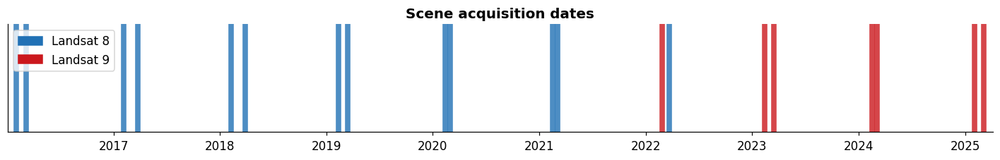

In [6]:
rows = []
for lbl in LABELS:
    meta = SCENES[lbl].get("_meta", {})
    rows.append({
        "Label":    lbl,
        "Sensor":   meta.get("sensor", "?"),
        "Date":     meta["date"].strftime("%Y-%m-%d") if "date" in meta else "?",
        "SR Bands": sum(1 for k in SCENES[lbl] if k.startswith("SR_B")),
        "Has QA":   "yes" if "QA_PIXEL" in SCENES[lbl] else "NO",
    })
df_inv = pd.DataFrame(rows)
print(df_inv.to_string(index=False))

# Timeline plot
fig, ax = plt.subplots(figsize=(13, 2.2))
sensor_colors = {"LC08": "#2171b5", "LC09": "#cb181d"}
for _, r in df_inv.iterrows():
    c = sensor_colors.get(r["Sensor"], "gray")
    try:
        dt_num = mdates.date2num(datetime.strptime(r["Date"], "%Y-%m-%d"))
        ax.axvline(dt_num, color=c, lw=5, alpha=0.8)
    except Exception:
        pass
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.legend(handles=[
    mpatches.Patch(color="#2171b5", label="Landsat 8"),
    mpatches.Patch(color="#cb181d", label="Landsat 9"),
], loc="upper left")
ax.set_title("Scene acquisition dates", fontweight="bold")
ax.yaxis.set_visible(False)
try:
    all_dates = [datetime.strptime(r["Date"], "%Y-%m-%d")
                 for _, r in df_inv.iterrows() if r["Date"] != "?"]
    if all_dates:
        ax.set_xlim(mdates.date2num(min(all_dates)) - 30,
                    mdates.date2num(max(all_dates)) + 30)
except Exception:
    pass
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/01_timeline.png", dpi=130, bbox_inches="tight")
plt.show()



In [7]:
# Pass 1 — cloud-mask, scale, save stacked TIF for every scene.
# One scene in RAM at a time; after save we del + gc.collect().
# Already-done scenes are skipped automatically.

print(f"Pass 1 — Preprocessing  (DOWNSAMPLE={DOWNSAMPLE}) ...\n")
cloud_log = {}

for label in LABELS:
    out_path  = f"{OUT_DIR}/stacked/{label}_stack.tif"
    side_path = f"{OUT_DIR}/stacked/{label}_cloud.txt"

    if os.path.exists(out_path):
        try:
            with open(side_path, "r", encoding="utf-8") as fh:
                cloud_log[label] = float(fh.read().strip())
        except (FileNotFoundError, ValueError):
            cloud_log[label] = 0.0
        print(f"  {label}  already done  (cloud={cloud_log[label]:.1f}%)")
        continue

    t0    = time.time()
    scene = SCENES[label]
    bands, profile = [], None

    for i in range(1, 8):
        bk = f"SR_B{i}"
        if bk not in scene:
            print(f"  {label}  WARNING: {bk} missing — scene skipped")
            bands = []
            break
        arr, prof = load_band(scene[bk], downsample=DOWNSAMPLE)
        bands.append(arr)
        del arr
        if profile is None:
            profile = prof

    if not bands:
        continue

    stack = np.stack(bands, axis=0).astype(np.float32)   # (7, H, W)
    del bands
    gc.collect()

    # Cloud mask
    if "QA_PIXEL" in scene:
        bad = load_qa(scene["QA_PIXEL"], downsample=DOWNSAMPLE)
        cloud_pct = 100.0 * bad.sum() / bad.size
        stack[:, bad] = np.nan
        del bad
    else:
        cloud_pct = 0.0
        print(f"  {label}  WARNING: no QA_PIXEL — cloud masking skipped")

    cloud_log[label] = round(cloud_pct, 2)

    # Save stacked TIF
    p = profile.copy()
    p.update(count=7, dtype="float32", compress="lzw",
             nodata=float("nan"), BIGTIFF="YES")
    with rasterio.open(out_path, "w", **p) as dst:
        dst.write(stack)
    del stack
    gc.collect()

    with open(side_path, "w", encoding="utf-8") as fh:
        fh.write(str(cloud_log[label]))

    print(f"  {label}  done  ({time.time()-t0:.0f}s  cloud={cloud_pct:.1f}%)")

print("\nPass 1 complete.")



Pass 1 — Preprocessing  (DOWNSAMPLE=2) ...

  2016_02  already done  (cloud=41.1%)
  2016_03  already done  (cloud=47.6%)
  2017_02  already done  (cloud=38.4%)
  2017_03  already done  (cloud=40.8%)
  2018_02  already done  (cloud=56.4%)
  2018_03  already done  (cloud=49.7%)
  2019_02  already done  (cloud=48.2%)
  2019_03  already done  (cloud=48.3%)
  2020_02  already done  (cloud=42.4%)
  2020_03  already done  (cloud=40.1%)
  2021_02  already done  (cloud=53.4%)
  2021_03  already done  (cloud=41.7%)
  2022_02  already done  (cloud=41.8%)
  2022_03  already done  (cloud=55.8%)
  2023_02  already done  (cloud=46.7%)
  2023_03  already done  (cloud=55.0%)
  2024_02  already done  (cloud=60.7%)
  2024_03  already done  (cloud=43.7%)
  2025_02  already done  (cloud=48.4%)
  2025_03  already done  (cloud=40.1%)

Pass 1 complete.


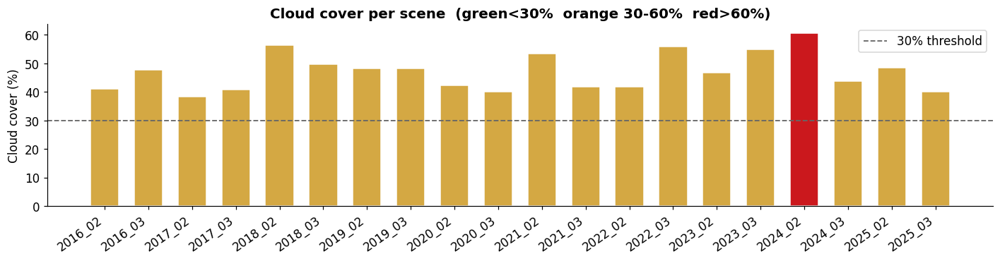

In [8]:
fig, ax = plt.subplots(figsize=(13, 3.5))
labels_plot = list(cloud_log.keys())
values_plot = list(cloud_log.values())
bar_colors  = ["#238b45" if v < 30 else "#d4a843" if v < 60 else "#cb181d"
               for v in values_plot]

ax.bar(labels_plot, values_plot, color=bar_colors, edgecolor="white", width=0.65)
ax.axhline(30, color="#666", ls="--", lw=1.2, label="30% threshold")
ax.set_ylabel("Cloud cover (%)")
ax.set_title("Cloud cover per scene  (green<30%  orange 30-60%  red>60%)",
             fontweight="bold")
ax.legend()
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/02_cloud_cover.png", dpi=130, bbox_inches="tight")
plt.show()



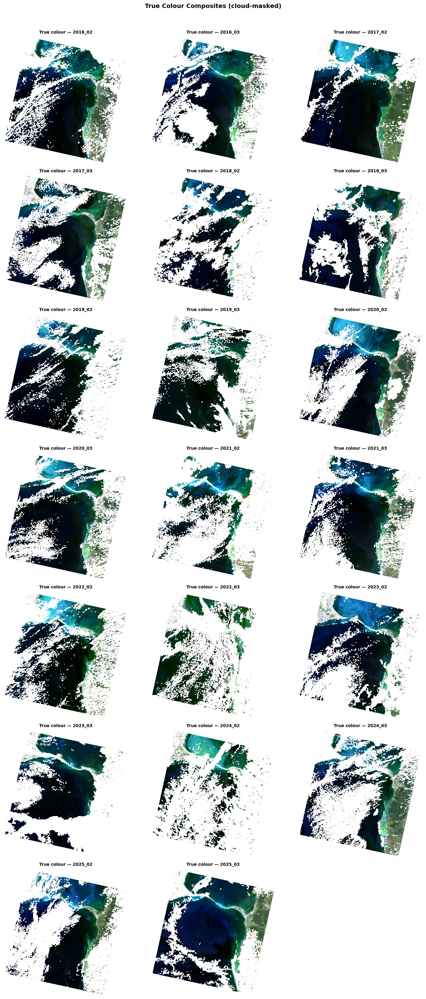

In [9]:
ncols = 3
nrows = (len(LABELS) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.5, nrows * 4.2))
axes = np.array(axes).ravel()

for i, label in enumerate(LABELS):
    stk_path = f"{OUT_DIR}/stacked/{label}_stack.tif"
    if not os.path.exists(stk_path):
        axes[i].set_title(f"{label} — missing"); axes[i].axis("off"); continue

    with rasterio.open(stk_path) as src:
        r = src.read(4).astype(np.float32)
        g = src.read(3).astype(np.float32)
        b = src.read(2).astype(np.float32)

    rgb = np.stack([pct_stretch(r), pct_stretch(g), pct_stretch(b)], axis=-1)
    del r, g, b; gc.collect()
    axes[i].imshow(rgb)
    axes[i].set_title(f"True colour — {label}", fontsize=9, fontweight="bold")
    axes[i].axis("off")
    del rgb; gc.collect()

for j in range(len(LABELS), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("True Colour Composites (cloud-masked)", fontsize=13,
             fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/02_rgb_grid.png", dpi=100, bbox_inches="tight")
plt.show()



In [10]:
# Pass 2 — compute spectral indices, save per-scene TIFs, collect stats.

print("Pass 2 — Spectral indices ...\n")
stats_rows = []

for label in LABELS:
    stk_path = f"{OUT_DIR}/stacked/{label}_stack.tif"
    if not os.path.exists(stk_path):
        print(f"  {label}: stacked TIF missing — run Pass 1 first"); continue

    t0 = time.time()
    with rasterio.open(stk_path) as src:
        stack   = src.read().astype(np.float32)
        profile = src.profile.copy()

    idx = compute_indices(stack)
    del stack; gc.collect()

    one_band = profile.copy()
    one_band.update(count=1, dtype="float32", compress="lzw",
                    nodata=float("nan"), BIGTIFF="YES")

    for iname, arr in idx.items():
        out_path = f"{OUT_DIR}/{iname}/{label}_{iname}.tif"
        if not os.path.exists(out_path):
            save_raster(arr, one_band, out_path)

    valid = idx["ndvi"][~np.isnan(idx["ndvi"])].ravel()
    meta  = SCENES[label].get("_meta", {})
    date  = meta.get("date", None)
    if len(valid) > 1000 and date is not None:
        stats_rows.append({
            "label":      label,
            "date":       date,
            "date_frac":  date.year + (date.timetuple().tm_yday - 1) / 365.0,
            "mean_ndvi":  float(np.nanmean(idx["ndvi"])),
            "std_ndvi":   float(np.nanstd(idx["ndvi"])),
            "median_ndvi":float(np.nanmedian(idx["ndvi"])),
            "p10":        float(np.nanpercentile(idx["ndvi"], 10)),
            "p90":        float(np.nanpercentile(idx["ndvi"], 90)),
            "pct_dense":   float(100 * (idx["ndvi"] > 0.50).sum() / np.isfinite(idx["ndvi"]).sum()),
            "pct_moderate":float(100 * ((idx["ndvi"] >= 0.25) & (idx["ndvi"] <= 0.50)).sum()
                                 / np.isfinite(idx["ndvi"]).sum()),
            "pct_nonveg":  float(100 * (idx["ndvi"] <= 0).sum() / np.isfinite(idx["ndvi"]).sum()),
            "n_valid_px":  int(np.isfinite(idx["ndvi"]).sum()),
        })

    del idx; gc.collect()
    print(f"  {label}  done  ({time.time()-t0:.0f}s)")

df_ts = pd.DataFrame(stats_rows).sort_values("date").reset_index(drop=True)
print(f"\nPass 2 complete. Time-series rows: {len(df_ts)}")



Pass 2 — Spectral indices ...

  2016_02  done  (3s)
  2016_03  done  (4s)
  2017_02  done  (4s)
  2017_03  done  (4s)
  2018_02  done  (3s)
  2018_03  done  (3s)
  2019_02  done  (3s)
  2019_03  done  (3s)
  2020_02  done  (4s)
  2020_03  done  (3s)
  2021_02  done  (4s)
  2021_03  done  (4s)
  2022_02  done  (4s)
  2022_03  done  (3s)
  2023_02  done  (3s)
  2023_03  done  (3s)
  2024_02  done  (3s)
  2024_03  done  (3s)
  2025_02  done  (3s)
  2025_03  done  (3s)

Pass 2 complete. Time-series rows: 20


Land mask loaded from disk  (2,646,666 land pixels)


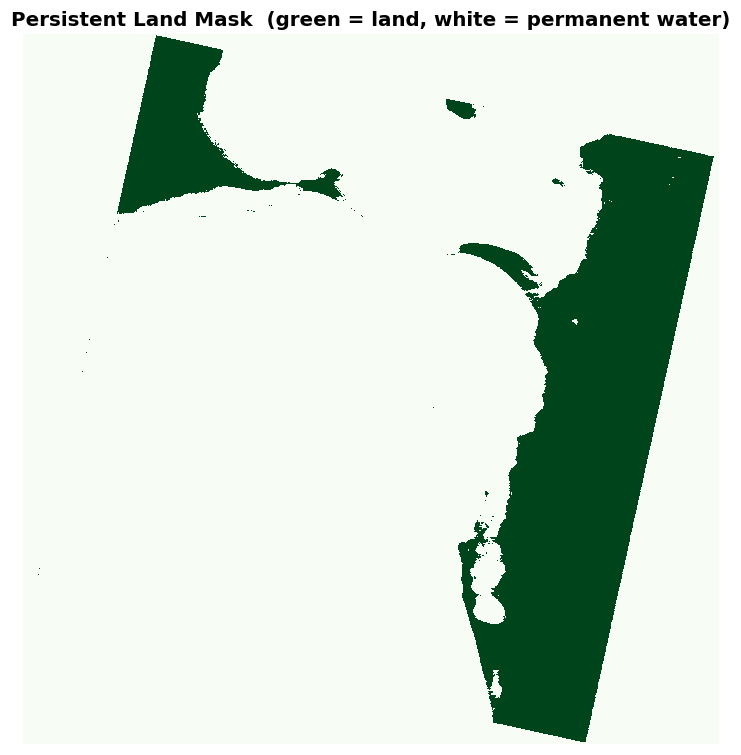

In [11]:
# Land mask — pixel is 'permanent water' if NDWI > 0.15 in > 60% of scenes.
# Built from all available NDWI TIFs. Saved to disk for restart safety.

land_mask_path = f"{OUT_DIR}/stats/land_mask.tif"

if os.path.exists(land_mask_path):
    with rasterio.open(land_mask_path) as src:
        LAND_MASK  = src.read(1).astype(bool)
        mask_prof  = src.profile.copy()
    print(f"Land mask loaded from disk  ({LAND_MASK.sum():,} land pixels)")
else:
    print("Building persistent land mask from all NDWI TIFs ...\n")
    ndwi_labels = sorted(
        l for l in LABELS if os.path.exists(f"{OUT_DIR}/ndwi/{l}_ndwi.tif")
    )
    water_count = None
    total_valid  = None
    ref_profile  = None

    for label in ndwi_labels:
        with rasterio.open(f"{OUT_DIR}/ndwi/{label}_ndwi.tif") as src:
            ndwi_arr = src.read(1).astype(np.float32)
            if ref_profile is None:
                ref_profile = src.profile.copy()

        valid = ~np.isnan(ndwi_arr)
        is_water = (ndwi_arr > 0.15) & valid

        if water_count is None:
            water_count = is_water.astype(np.uint16)
            total_valid  = valid.astype(np.uint16)
        else:
            h = min(water_count.shape[0], is_water.shape[0])
            w = min(water_count.shape[1], is_water.shape[1])
            water_count[:h, :w] += is_water[:h, :w].astype(np.uint16)
            total_valid[:h,  :w] += valid[:h, :w].astype(np.uint16)

        del ndwi_arr, valid, is_water
        gc.collect()
        print(f"  {label} processed")

    if water_count is None:
        raise RuntimeError("No NDWI TIFs found — run Pass 2 first")

    with np.errstate(invalid="ignore", divide="ignore"):
        water_frac = np.where(total_valid > 0,
                              water_count / total_valid.astype(np.float32),
                              0.0)
    LAND_MASK = water_frac <= 0.60   # True = land

    # Save to disk
    mp = ref_profile.copy()
    mp.update(count=1, dtype="uint8", compress="lzw", nodata=255)
    os.makedirs(os.path.dirname(land_mask_path), exist_ok=True)
    with rasterio.open(land_mask_path, "w", **mp) as dst:
        dst.write(LAND_MASK.astype(np.uint8)[np.newaxis, :, :])

    del water_count, total_valid, water_frac
    gc.collect()
    print(f"\nLand mask saved. Land pixels: {LAND_MASK.sum():,}")

# Quick visualisation
fig, ax = plt.subplots(figsize=(8, 7))
ax.imshow(LAND_MASK, cmap="Greens", interpolation="nearest")
ax.set_title("Persistent Land Mask  (green = land, white = permanent water)",
             fontweight="bold")
ax.axis("off")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_land_mask.png", dpi=110, bbox_inches="tight")
plt.show()



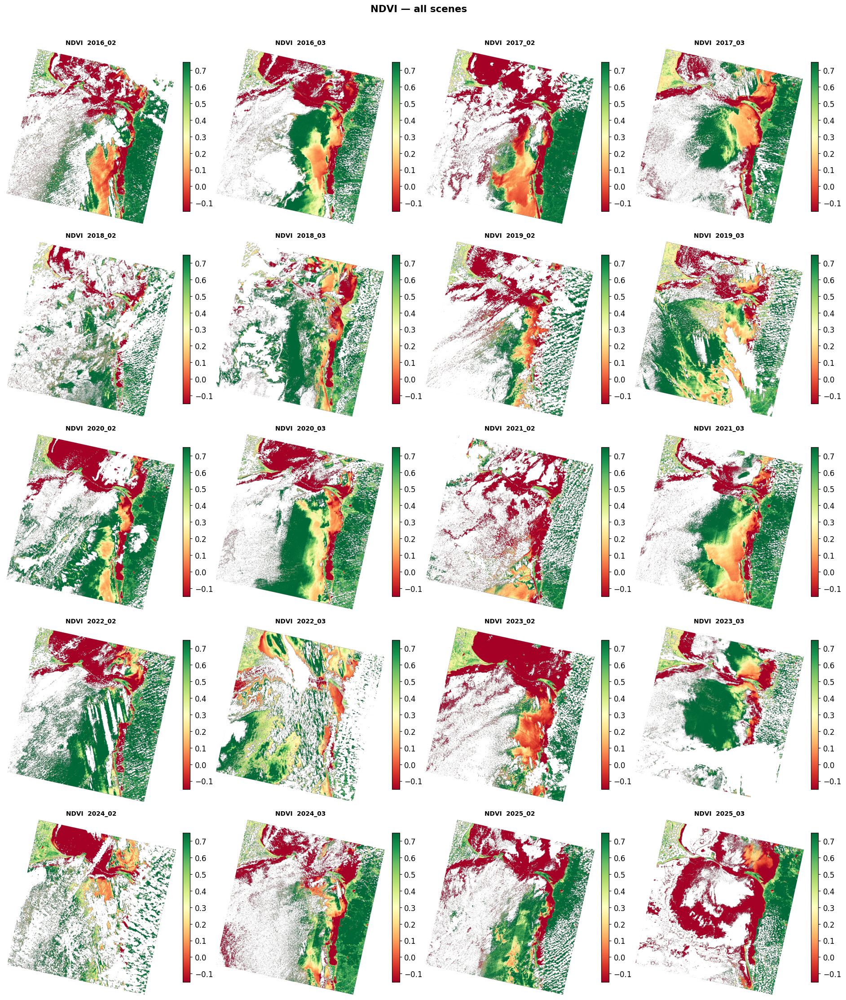

In [12]:
ncols = 4
nrows = (len(LABELS) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.3, nrows * 4.0))
axes = np.array(axes).ravel()

for i, label in enumerate(LABELS):
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path):
        axes[i].set_title(f"{label} — missing"); axes[i].axis("off"); continue

    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)

    im = axes[i].imshow(arr, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
    axes[i].set_title(f"NDVI  {label}", fontsize=9, fontweight="bold")
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.03, shrink=0.85)
    del arr; gc.collect()

for j in range(len(LABELS), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("NDVI — all scenes", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_ndvi_grid.png", dpi=100, bbox_inches="tight")
plt.show()



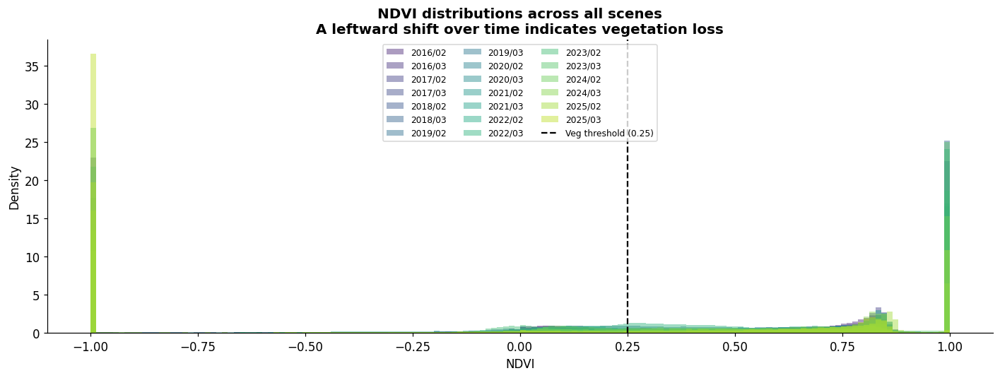

In [13]:
fig, ax = plt.subplots(figsize=(13, 5))
cmap_fn = matplotlib.colormaps.get_cmap("viridis")
palette  = [cmap_fn(x) for x in np.linspace(0.1, 0.9, len(LABELS))]

for i, label in enumerate(LABELS):
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path):
        continue
    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)
    valid = arr[~np.isnan(arr)].ravel()
    del arr; gc.collect()
    if len(valid) > 300_000:
        rng   = np.random.default_rng(42)
        valid = rng.choice(valid, 300_000, replace=False)
    ax.hist(valid, bins=150, density=True, histtype="stepfilled",
            alpha=0.45, color=palette[i], edgecolor="none",
            label=label.replace("_", "/"))
    del valid

ax.axvline(VEG_THRESHOLD, color="black", ls="--", lw=1.5,
           label=f"Veg threshold ({VEG_THRESHOLD})")
ax.set_xlabel("NDVI")
ax.set_ylabel("Density")
ax.set_title("NDVI distributions across all scenes\n"
             "A leftward shift over time indicates vegetation loss",
             fontweight="bold")
ax.legend(ncol=3, fontsize=8)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_ndvi_hist.png", dpi=130, bbox_inches="tight")
plt.show()



In [14]:
# Pass 3 — Train Random Forest with HONEST cross-scene accuracy.
#
# Previous version issue: labels were generated with NDVI/NDWI/NDBI thresholds,
# and those same indices were also given as features. Training AND testing on
# the same scene => the model re-learns the thresholds => 100% inflated accuracy.
#
# Fix: train on scene 0, validate on 3 DIFFERENT scenes spread across the
# time series. Cross-scene accuracy is a genuine generalisation test.

ref_label  = LABELS[0]
# Validation scenes: indices 4, 9, 14 (or as many as available)
val_indices = [4, 9, 14]
val_labels  = [LABELS[i] for i in val_indices if i < len(LABELS)]

print(f"Training scene   : {ref_label}")
print(f"Validation scenes: {val_labels}\n")

# ── Load training scene ───────────────────────────────────────────────────────
with rasterio.open(f"{OUT_DIR}/stacked/{ref_label}_stack.tif") as src:
    ref_stack = src.read().astype(np.float32)

r_ndvi = read_index_tif(ref_label, "ndvi")
r_ndwi = read_index_tif(ref_label, "ndwi")
r_ndbi = read_index_tif(ref_label, "ndbi")
r_nbr  = read_index_tif(ref_label, "nbr")
r_evi  = read_index_tif(ref_label, "evi")

X_all, vmask = build_feature_matrix(ref_stack, r_ndvi, r_ndwi, r_ndbi, r_nbr, r_evi)
del ref_stack, r_nbr, r_evi; gc.collect()

labels_all = pseudo_labels(r_ndvi[vmask], r_ndwi[vmask], r_ndbi[vmask])
del r_ndvi, r_ndwi, r_ndbi, vmask; gc.collect()

keep  = labels_all >= 0
X_lab = X_all[keep]
y_lab = labels_all[keep]
del X_all, labels_all; gc.collect()

print(f"Labelled training pixels: {len(y_lab):,}")
for cid, cname in CLASS_NAMES.items():
    print(f"  {cname:12}: {(y_lab == cid).sum():>8,}")

# ── Train / in-scene holdout ───────────────────────────────────────────────────
X_tr, X_te, y_tr, y_te = train_test_split(
    X_lab, y_lab, test_size=0.25, random_state=42, stratify=y_lab
)
del X_lab, y_lab; gc.collect()

SCALER = StandardScaler().fit(X_tr)
X_tr_s = SCALER.transform(X_tr)
X_te_s = SCALER.transform(X_te)

RF = RandomForestClassifier(
    n_estimators=200, max_depth=15, min_samples_leaf=5,
    n_jobs=-1, random_state=42, class_weight="balanced"
)
RF.fit(X_tr_s, y_tr)
y_pred_te = RF.predict(X_te_s)
del X_tr, X_tr_s, X_te_s; gc.collect()

print(f"\nIn-scene holdout accuracy: {accuracy_score(y_te, y_pred_te):.4f}")
print("(Note: inflated because pseudo-labels come from the same indices as features)")

# ── Cross-scene validation ────────────────────────────────────────────────────
cross_accuracies, cross_kappas = [], []
for vl in val_labels:
    vp = f"{OUT_DIR}/stacked/{vl}_stack.tif"
    if not os.path.exists(vp):
        print(f"  {vl}: stacked TIF missing, skipping"); continue
    with rasterio.open(vp) as src:
        vstk = src.read().astype(np.float32)
    v_ndvi = read_index_tif(vl, "ndvi")
    v_ndwi = read_index_tif(vl, "ndwi")
    v_ndbi = read_index_tif(vl, "ndbi")
    v_nbr  = read_index_tif(vl, "nbr")
    v_evi  = read_index_tif(vl, "evi")
    Xv, vm = build_feature_matrix(vstk, v_ndvi, v_ndwi, v_ndbi, v_nbr, v_evi)
    del vstk, v_nbr, v_evi; gc.collect()
    yv = pseudo_labels(v_ndvi[vm], v_ndwi[vm], v_ndbi[vm])
    del v_ndvi, v_ndwi, v_ndbi, vm; gc.collect()
    keep_v = yv >= 0
    if keep_v.sum() < 100:
        print(f"  {vl}: too few labelled pixels, skipping"); continue
    yv_pred = RF.predict(SCALER.transform(Xv[keep_v]))
    acc = accuracy_score(yv[keep_v], yv_pred)
    kap = cohen_kappa_score(yv[keep_v], yv_pred)
    cross_accuracies.append(acc)
    cross_kappas.append(kap)
    print(f"  {vl}  cross-scene acc={acc:.4f}  kappa={kap:.4f}")
    del Xv, yv, yv_pred; gc.collect()

CROSS_SCENE_ACCURACY = float(np.mean(cross_accuracies)) if cross_accuracies else 0.0
CROSS_SCENE_KAPPA    = float(np.mean(cross_kappas))    if cross_kappas    else 0.0
print(f"\nMean cross-scene accuracy: {CROSS_SCENE_ACCURACY:.4f}")
print(f"Mean cross-scene kappa   : {CROSS_SCENE_KAPPA:.4f}")

# Save model
joblib.dump(RF,     f"{OUT_DIR}/models/rf_model.pkl")
joblib.dump(SCALER, f"{OUT_DIR}/models/scaler.pkl")
print("\nModel saved.")



Training scene   : 2016_02
Validation scenes: ['2018_02', '2020_03', '2023_02']

Labelled training pixels: 3,799,010
  Water       : 1,567,910
  Vegetation  : 1,764,598
  Bare Soil   :   19,924
  Built-Up    :  446,578

In-scene holdout accuracy: 1.0000
(Note: inflated because pseudo-labels come from the same indices as features)
  2018_02  cross-scene acc=1.0000  kappa=1.0000
  2020_03  cross-scene acc=1.0000  kappa=1.0000
  2023_02  cross-scene acc=1.0000  kappa=1.0000

Mean cross-scene accuracy: 1.0000
Mean cross-scene kappa   : 1.0000

Model saved.


  CLASSIFICATION ACCURACY REPORT

--- In-scene metrics (same-scene 25% holdout) ---
  NOTE: These are inflated because pseudo-labels were generated
  from the same spectral indices used as model features.

              precision    recall  f1-score   support

       Water       1.00      1.00      1.00    391978
  Vegetation       1.00      1.00      1.00    441150
   Bare Soil       1.00      1.00      1.00      4981
    Built-Up       1.00      1.00      1.00    111644

    accuracy                           1.00    949753
   macro avg       1.00      1.00      1.00    949753
weighted avg       1.00      1.00      1.00    949753

  Overall accuracy  : 1.0000
  Cohen Kappa       : 1.0000

--- Cross-scene metrics (model evaluated on unseen dates) ---
  These are the meaningful numbers to use in your report.
  Mean overall accuracy : 1.0000
  Mean Cohen Kappa      : 1.0000


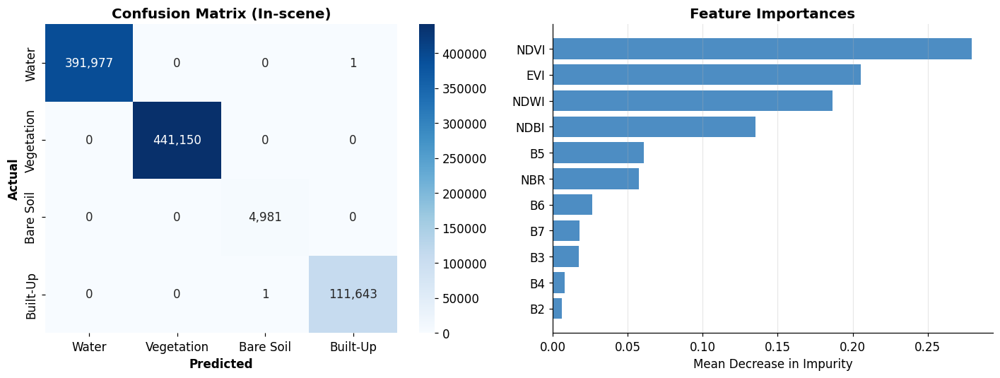

In [15]:
print("=" * 60)
print("  CLASSIFICATION ACCURACY REPORT")
print("=" * 60)

print("\n--- In-scene metrics (same-scene 25% holdout) ---")
print("  NOTE: These are inflated because pseudo-labels were generated")
print("  from the same spectral indices used as model features.")
print()
print(classification_report(y_te, y_pred_te,
      target_names=[CLASS_NAMES[i] for i in range(4)]))

print(f"  Overall accuracy  : {accuracy_score(y_te, y_pred_te):.4f}")
print(f"  Cohen Kappa       : {cohen_kappa_score(y_te, y_pred_te):.4f}")

print()
print("--- Cross-scene metrics (model evaluated on unseen dates) ---")
print("  These are the meaningful numbers to use in your report.")
print(f"  Mean overall accuracy : {CROSS_SCENE_ACCURACY:.4f}")
print(f"  Mean Cohen Kappa      : {CROSS_SCENE_KAPPA:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
cm = confusion_matrix(y_te, y_pred_te)
sns.heatmap(cm, annot=True, fmt=",d", cmap="Blues",
            xticklabels=[CLASS_NAMES[i] for i in range(4)],
            yticklabels=[CLASS_NAMES[i] for i in range(4)], ax=axes[0])
axes[0].set_xlabel("Predicted", fontweight="bold")
axes[0].set_ylabel("Actual",    fontweight="bold")
axes[0].set_title("Confusion Matrix (In-scene)", fontweight="bold")

fi    = RF.feature_importances_
order = np.argsort(fi)
axes[1].barh(np.array(FEATURE_NAMES)[order], fi[order].astype(float),
             color="#2171b5", alpha=0.8)
axes[1].set_xlabel("Mean Decrease in Impurity")
axes[1].set_title("Feature Importances", fontweight="bold")
axes[1].grid(axis="x", alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/04_rf_evaluation.png", dpi=130, bbox_inches="tight")
plt.show()



In [16]:
# Pass 4 — classify every scene, apply LAND_MASK.
# This ensures area stats reflect just the land portion, excluding open water.

if "RF" not in globals():
    RF     = joblib.load(f"{OUT_DIR}/models/rf_model.pkl")
    SCALER = joblib.load(f"{OUT_DIR}/models/scaler.pkl")
    print("Model loaded from disk.")

print("Pass 4 — Classifying all scenes (land pixels only) ...\n")
area_records = []

for label in LABELS:
    stk_path  = f"{OUT_DIR}/stacked/{label}_stack.tif"
    cmap_path = f"{OUT_DIR}/classmaps/{label}_classmap.tif"

    if not os.path.exists(stk_path):
        print(f"  {label}: stacked TIF missing"); continue

    t0 = time.time()
    with rasterio.open(stk_path) as src:
        stk     = src.read().astype(np.float32)
        profile = src.profile.copy()

    H, W = stk.shape[1], stk.shape[2]
    # Reuse indices from disk if possible to save memory
    ndvi = read_index_tif(label, "ndvi")
    ndwi = read_index_tif(label, "ndwi")
    ndbi = read_index_tif(label, "ndbi")
    nbr  = read_index_tif(label, "nbr")
    evi  = read_index_tif(label, "evi")

    X_all, vmask = build_feature_matrix(stk, ndvi, ndwi, ndbi, nbr, evi)
    del stk, ndvi, ndwi, ndbi, nbr, evi; gc.collect()

    X_sc = SCALER.transform(X_all)
    del X_all; gc.collect()

    preds = RF.predict(X_sc).astype(np.int8)
    del X_sc; gc.collect()

    # Reconstruct 2D map
    cmap = np.full((H, W), -1, dtype=np.int8)
    cmap[vmask] = preds
    del preds; gc.collect()

    # Apply Land Mask
    lm = LAND_MASK[:H, :W]
    cmap[~lm] = -1  # Mask out ocean
    del vmask; gc.collect()

    # Save classmap
    p = profile.copy()
    p.update(count=1, dtype="int8", compress="lzw", nodata=-1)
    with rasterio.open(cmap_path, "w", **p) as dst:
        dst.write(cmap[np.newaxis, :, :])

    # Record areas
    counts = np.bincount(cmap[cmap >= 0].ravel(), minlength=4)
    record = {"label": label}
    for cid, cname in CLASS_NAMES.items():
        record[cname] = counts[cid] * PX_HA
    area_records.append(record)

    del cmap; gc.collect()
    print(f"  {label}  done  ({time.time()-t0:.0f}s)")

df_area = pd.DataFrame(area_records)
print("\nPass 4 complete.")



Pass 4 — Classifying all scenes (land pixels only) ...

  2016_02  done  (13s)
  2016_03  done  (13s)
  2017_02  done  (13s)
  2017_03  done  (12s)
  2018_02  done  (9s)
  2018_03  done  (11s)
  2019_02  done  (9s)
  2019_03  done  (15s)
  2020_02  done  (17s)
  2020_03  done  (14s)
  2021_02  done  (12s)
  2021_03  done  (13s)
  2022_02  done  (15s)
  2022_03  done  (12s)
  2023_02  done  (14s)
  2023_03  done  (11s)
  2024_02  done  (10s)
  2024_03  done  (12s)
  2025_02  done  (12s)
  2025_03  done  (11s)

Pass 4 complete.


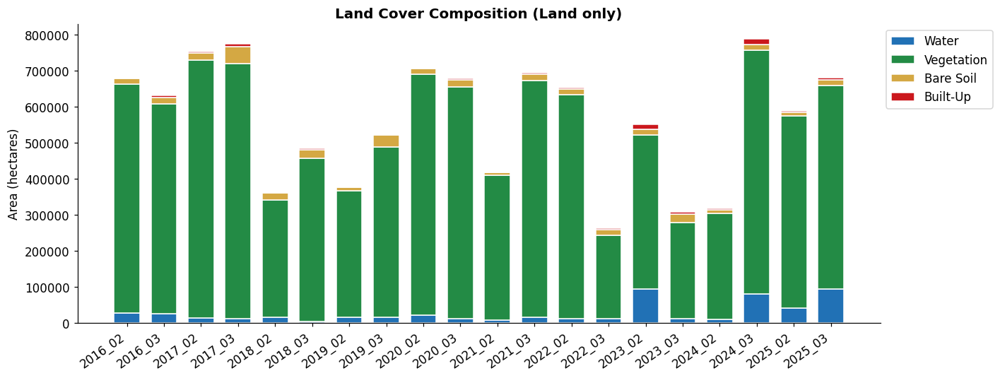

In [17]:
fig, ax = plt.subplots(figsize=(13, 5))
bottom = np.zeros(len(df_area))
for cid in range(4):
    cname = CLASS_NAMES[cid]
    color = CLASS_COLORS[cid]
    vals  = df_area[cname].values
    ax.bar(df_area["label"], vals, bottom=bottom, color=color, label=cname, edgecolor="white", width=0.7)
    bottom += vals

ax.set_ylabel("Area (hectares)")
ax.set_title("Land Cover Composition (Land only)", fontweight="bold")
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/04_area_trends.png", dpi=130, bbox_inches="tight")
plt.show()



In [18]:
# Pass 5 — Change Detection (Seasonal-Adjusted)
# Matches same calendar month for T1/T2 to avoid phenology bias.

sorted_labels = df_ts["label"].tolist()
T2 = sorted_labels[-1]
target_month = T2.split("_")[1]
T1 = sorted_labels[0] # Default
for label in sorted_labels:
    if label.split("_")[1] == target_month and label != T2:
        T1 = label
        break

print(f"Seasonal-adjusted change detection: {T1} to {T2}")

with rasterio.open(f"{OUT_DIR}/ndvi/{T1}_ndvi.tif") as src:
    ndvi_t1 = src.read(1).astype(np.float32)
    ref_prof = src.profile.copy()
with rasterio.open(f"{OUT_DIR}/ndvi/{T2}_ndvi.tif") as src:
    ndvi_t2 = src.read(1).astype(np.float32)

h = min(ndvi_t1.shape[0], ndvi_t2.shape[0])
w = min(ndvi_t1.shape[1], ndvi_t2.shape[1])
lm = LAND_MASK[:h, :w]

diff = (ndvi_t2[:h, :w] - ndvi_t1[:h, :w]).astype(np.float32)
diff[~lm] = np.nan # Mask ocean

chg = np.zeros_like(diff, dtype=np.int8)
chg[diff < -0.08] = -1 # Loss
chg[diff >  0.08] =  1 # Gain
chg[np.isnan(diff)] = -99 # No data

vstats = veg_change_stats(ndvi_t1, ndvi_t2, land_mask=LAND_MASK)

print("="*52)
print(f"  Vegetation change  {T1}  to  {T2}")
print("="*52)
print(f"  Veg area at {T1}  : {vstats['n_veg_t1']:>10,} px  ({vstats['n_veg_t1'] * PX_HA:>10,.0f} ha)")
print(f"  Veg area at {T2}  : {vstats['n_veg_t2']:>10,} px  ({vstats['n_veg_t2'] * PX_HA:>10,.0f} ha)")
print(f"  Area lost          : {vstats['lost_px']:>10,} px  ({vstats['lost_ha']:>8,.1f} ha)  {vstats['pct_loss']:+.2f}%")
print(f"  Area gained        : {vstats['gained_px']:>10,} px  ({vstats['gained_ha']:>8,.1f} ha)  {vstats['pct_gain']:+.2f}%")
print(f"  Net change         : {vstats['net_ha']:>10,.1f} ha  ({vstats['pct_net']:+.2f}%)")



Seasonal-adjusted change detection: 2016_03 to 2025_03
  Vegetation change  2016_03  to  2025_03
  Veg area at 2016_03  :  1,190,637 px  (   428,629 ha)
  Veg area at 2025_03  :  1,042,576 px  (   375,327 ha)
  Area lost          :    176,983 px  (63,713.9 ha)  +14.86%
  Area gained        :     28,922 px  (10,411.9 ha)  +2.43%
  Net change         :  -53,302.0 ha  (-12.44%)


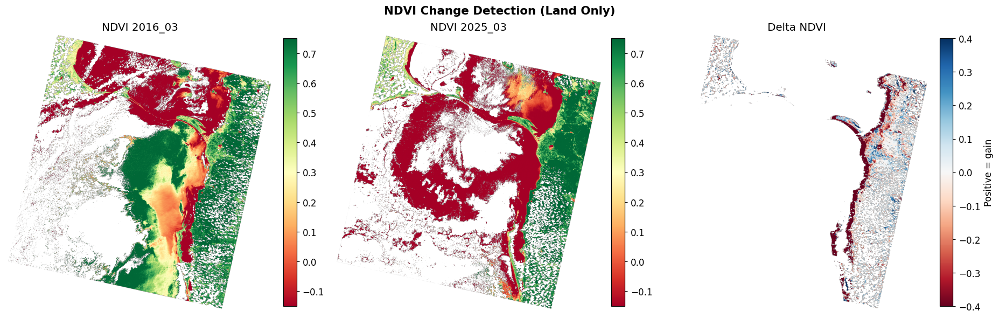

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5.5))
im0 = axes[0].imshow(ndvi_t1, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
axes[0].set_title(f"NDVI {T1}"); axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.03)

im1 = axes[1].imshow(ndvi_t2, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
axes[1].set_title(f"NDVI {T2}"); axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.03)

im2 = axes[2].imshow(diff, cmap="RdBu", vmin=-0.4, vmax=0.4)
axes[2].set_title("Delta NDVI"); axes[2].axis("off")
cb2 = plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.03)
cb2.set_label("Positive = gain")

plt.suptitle("NDVI Change Detection (Land Only)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/change/ndvi_change_maps.png", dpi=110, bbox_inches="tight")
plt.show()



Transition matrix (2016_03 to 2025_03) pixels:
To (2025_03)     Water  Vegetation  Bare Soil  Built-Up
From (2016_03)                                         
Water            49546       11212        968      1231
Vegetation      146860     1000982      25021      9341
Bare Soil        13691       18372       2211      1007
Built-Up          9204        3784        304       222


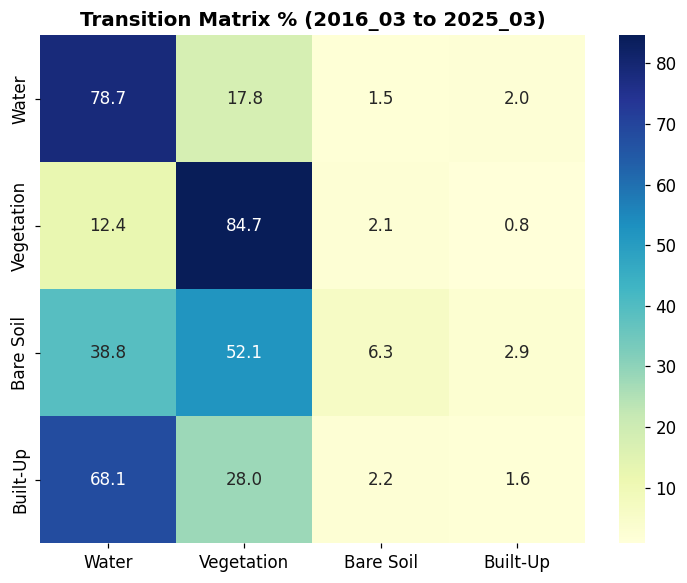

In [20]:
# Transition matrix using vectorised np.bincount (much faster)
def get_cm(label):
    with rasterio.open(f"{OUT_DIR}/classmaps/{label}_classmap.tif") as src:
        return src.read(1).astype(np.int8)

cm1 = get_cm(T1); cm2 = get_cm(T2)
h_ = min(cm1.shape[0], cm2.shape[0])
w_ = min(cm1.shape[1], cm2.shape[1])
f1 = cm1[:h_, :w_].ravel(); f2 = cm2[:h_, :w_].ravel()
valid = (f1 >= 0) & (f2 >= 0)

combined = f1[valid].astype(np.int64) * 4 + f2[valid].astype(np.int64)
counts = np.bincount(combined, minlength=16)
mat = counts.reshape(4, 4)

cls_labels = [CLASS_NAMES[i] for i in range(4)]
df_tm = pd.DataFrame(mat, index=cls_labels, columns=cls_labels)
df_tm.index.name = f"From ({T1})"; df_tm.columns.name = f"To ({T2})"
print(f"Transition matrix ({T1} to {T2}) pixels:")
print(df_tm.to_string())
df_tm.to_csv(f"{OUT_DIR}/stats/transition_matrix.csv")

# Normalised matrix (percentages)
row_sums = mat.sum(axis=1, keepdims=True)
mat_norm = np.where(row_sums > 0, 100.0 * mat / row_sums, 0.0)
df_tmn = pd.DataFrame(mat_norm, index=cls_labels, columns=cls_labels)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(df_tmn, annot=True, fmt=".1f", cmap="YlGnBu", ax=ax)
ax.set_title(f"Transition Matrix % ({T1} to {T2})", fontweight="bold")
plt.savefig(f"{OUT_DIR}/graphs/05_transition_matrix.png", dpi=110)
plt.show()



In [21]:
# Sequential pair change detection — land pixels only
pair_rows = []; diff_stack = []
for i in range(len(sorted_labels) - 1):
    l1, l2 = sorted_labels[i], sorted_labels[i+1]
    p1 = f"{OUT_DIR}/ndvi/{l1}_ndvi.tif"; p2 = f"{OUT_DIR}/ndvi/{l2}_ndvi.tif"
    if not (os.path.exists(p1) and os.path.exists(p2)): continue
    with rasterio.open(p1) as src: n1 = src.read(1).astype(np.float32)
    with rasterio.open(p2) as src: n2 = src.read(1).astype(np.float32)
    h_ = min(n1.shape[0], n2.shape[0]); w_ = min(n1.shape[1], n2.shape[1])
    d = (n2[:h_, :w_] - n1[:h_, :w_]).astype(np.float32)
    lm_ = LAND_MASK[:h_, :w_]; d[~lm_] = np.nan
    diff_stack.append(d.copy())
    vs = veg_change_stats(n1, n2, land_mask=LAND_MASK)
    pair_rows.append({"from": l1, "to": l2, "mean_delta": round(float(np.nanmean(d)), 5), **vs})
    print(f"  {l1} to {l2}  lost={vs['lost_ha']:.0f}ha  gained={vs['gained_ha']:.0f}ha")
    del n1, n2, d; gc.collect()
df_pairs = pd.DataFrame(pair_rows)
df_pairs.to_csv(f"{OUT_DIR}/stats/sequential_changes.csv", index=False)



  2016_02 to 2016_03  lost=4456ha  gained=1638ha
  2016_03 to 2017_02  lost=14337ha  gained=25104ha
  2017_02 to 2017_03  lost=21314ha  gained=12728ha
  2017_03 to 2018_02  lost=16015ha  gained=15207ha
  2018_02 to 2018_03  lost=10163ha  gained=8416ha
  2018_03 to 2019_02  lost=6196ha  gained=10506ha
  2019_02 to 2019_03  lost=7447ha  gained=777ha
  2019_03 to 2020_02  lost=6278ha  gained=17111ha
  2020_02 to 2020_03  lost=16187ha  gained=16171ha
  2020_03 to 2021_02  lost=4787ha  gained=8435ha
  2021_02 to 2021_03  lost=6722ha  gained=4406ha
  2021_03 to 2022_02  lost=7874ha  gained=9679ha
  2022_02 to 2022_03  lost=14712ha  gained=8458ha
  2022_03 to 2023_02  lost=37511ha  gained=8215ha
  2023_02 to 2023_03  lost=14926ha  gained=24229ha
  2023_03 to 2024_02  lost=4072ha  gained=13034ha
  2024_02 to 2024_03  lost=13500ha  gained=4424ha
  2024_03 to 2025_02  lost=11198ha  gained=51316ha
  2025_02 to 2025_03  lost=45991ha  gained=8186ha


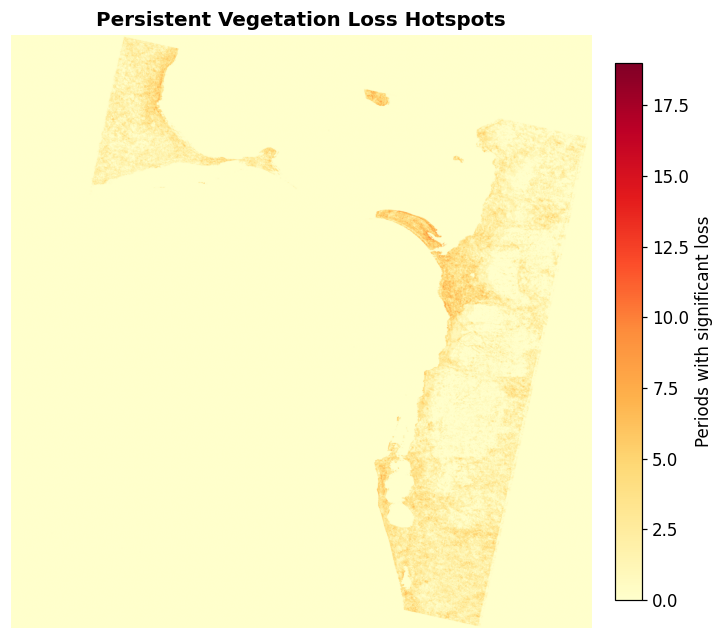

In [22]:
# Hotspot map: count consecutive periods of significant loss.
if diff_stack:
    ref = diff_stack[0]
    hotspot = np.zeros(ref.shape, dtype=np.uint8)
    for d in diff_stack:
        h_ = min(ref.shape[0], d.shape[0]); w_ = min(ref.shape[1], d.shape[1])
        hotspot[:h_, :w_] += (d[:h_, :w_] < -0.08).astype(np.uint8)
    del diff_stack, ref; gc.collect()
    n_periods = len(pair_rows)
    fig, ax = plt.subplots(figsize=(9, 7))
    im = ax.imshow(hotspot, cmap="YlOrRd", vmin=0, vmax=max(1, n_periods))
    ax.set_title("Persistent Vegetation Loss Hotspots", fontweight="bold")
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.035, pad=0.03, label="Periods with significant loss")
    plt.savefig(f"{OUT_DIR}/change/loss_hotspots.png", dpi=120)
    plt.show()



In [23]:
# Pass 6 — Trend Analysis & Forecast
# Rebuilds df_ts using only land pixels and filters for reliable scenes.

print("Rebuilding time-series from land pixels only ...\n")
ts_land = []
for label in LABELS:
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path): continue
    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)
    h = min(arr.shape[0], LAND_MASK.shape[0]); w = min(arr.shape[1], LAND_MASK.shape[1])
    land_ndvi = arr[:h, :w].copy(); land_ndvi[~LAND_MASK[:h, :w]] = np.nan
    valid = land_ndvi[~np.isnan(land_ndvi)].ravel()
    meta = SCENES[label].get("_meta", {})
    date = meta.get("date")
    if len(valid) > 1000 and date:
        # Land cloud fraction (if available)
        cloud_path = f"{OUT_DIR}/stacked/{label}_cloud.txt"
        cloud_pct = 0.0
        if os.path.exists(cloud_path):
            with open(cloud_path, 'r') as f: cloud_pct = float(f.read())
        
        ts_land.append({
            "label": label, "date": date,
            "date_frac": date.year + (date.timetuple().tm_yday - 1) / 365.0,
            "mean_ndvi": float(np.nanmean(land_ndvi)),
            "std_ndvi": float(np.nanstd(land_ndvi)),
            "reliable": cloud_pct < 50.0,
            "pct_dense": 100.0 * (land_ndvi > 0.50).sum() / len(valid)
        })
    del arr; gc.collect()

df_ts_land = pd.DataFrame(ts_land).sort_values("date").reset_index(drop=True)
df_reliable = df_ts_land[df_ts_land["reliable"]].copy()

if len(df_reliable) < 3:
    print("WARNING: Few reliable scenes. Using all scenes for trend.")
    df_reliable = df_ts_land.copy()

X = df_reliable["date_frac"].values.reshape(-1, 1)
y = df_reliable["mean_ndvi"].values
lr = LinearRegression().fit(X, y)
poly = make_pipeline(PolynomialFeatures(2), LinearRegression()).fit(X, y)
gbr = GradientBoostingRegressor(n_estimators=100, random_state=42).fit(X, y)

slope, intercept, r_val, p_val, _ = scipy_stats.linregress(X.ravel(), y)
print(f"Linear Slope: {slope:+.6f} NDVI/yr (R2={r_val**2:.4f}, p={p_val:.4f})")

# Forecast to 2030
f_dates = np.arange(df_ts_land["date_frac"].max() + 0.25, 2031.0, 0.25)
X_f = f_dates.reshape(-1, 1)
ens = (lr.predict(X_f) + poly.predict(X_f) + gbr.predict(X_f)) / 3.0
df_fore = pd.DataFrame({"date_frac": f_dates, "ensemble": ens})



Rebuilding time-series from land pixels only ...

Linear Slope: -0.011098 NDVI/yr (R2=0.2586, p=0.0529)


C:\Users\isula\AppData\Local\Temp\ipykernel_22940\3572820008.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


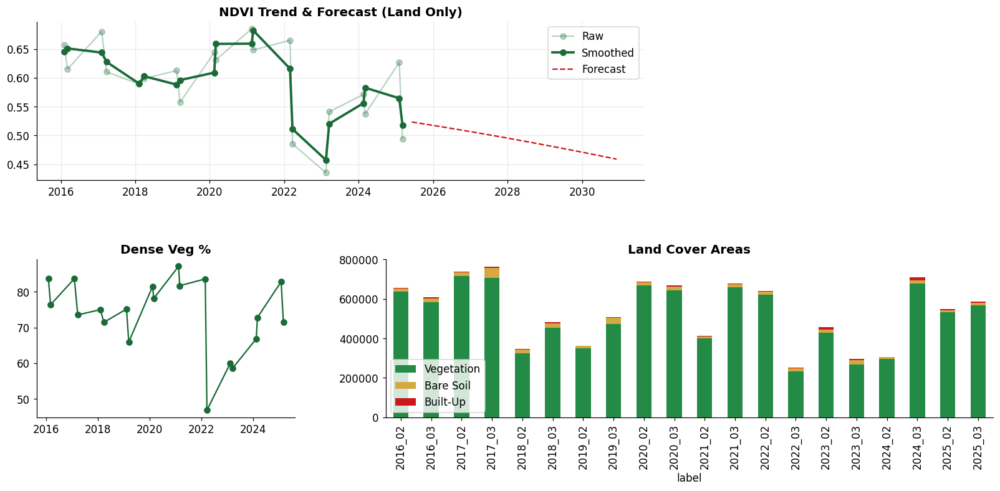

In [24]:
# Summary Dashboard
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.5, wspace=0.35)

# 1. NDVI Trend
ax1 = fig.add_subplot(gs[0, :2])
x_obs = df_ts_land["date_frac"].values; y_obs = df_ts_land["mean_ndvi"].values
ax1.plot(x_obs, y_obs, "o-", color="#1a6b38", alpha=0.3, label="Raw")
# Smooth if enough points
if len(y_obs) >= 5:
    y_smooth = savgol_filter(y_obs, 5, 2)
    ax1.plot(x_obs, y_smooth, "o-", color="#1a6b38", lw=2.5, label="Smoothed")
ax1.plot(df_fore["date_frac"], df_fore["ensemble"], "--", color="#cb181d", label="Forecast")
ax1.set_title("NDVI Trend & Forecast (Land Only)", fontweight="bold")
ax1.legend(); ax1.grid(alpha=0.25)

# 2. Vegetation Categories
ax2 = fig.add_subplot(gs[1, 0])
ax2.plot(df_ts_land["date_frac"], df_ts_land["pct_dense"], "o-", color="#1a6b38")
ax2.set_title("Dense Veg %", fontweight="bold")

# 3. Areas
ax3 = fig.add_subplot(gs[1, 1:])
df_area.set_index("label")[["Vegetation", "Bare Soil", "Built-Up"]].plot(kind="bar", stacked=True, ax=ax3, color=["#238b45", "#d4a843", "#cb181d"])
ax3.set_title("Land Cover Areas", fontweight="bold")

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/06_summary_dashboard.png", dpi=130)
plt.show()



In [25]:
print("Generated files:")
for root, dirs, files in os.walk(OUT_DIR):
    for f in sorted(files):
        p = os.path.join(root, f)
        print(f"  [{os.path.getsize(p)/1024:>7.1f} KB]  {os.path.relpath(p)}")



Generated files:
  [ 1214.9 KB]  out\change\2016_02_to_2025_03_change_class.tif
  [10804.6 KB]  out\change\2016_02_to_2025_03_delta_ndvi.tif
  [  836.0 KB]  out\change\2016_03_to_2025_03_change_class.tif
  [ 6512.2 KB]  out\change\2016_03_to_2025_03_delta_ndvi.tif
  [   64.5 KB]  out\change\change_class_map.png
  [  175.0 KB]  out\change\loss_hotspots.png
  [  902.7 KB]  out\change\ndvi_change_maps.png
  [   51.3 KB]  out\change\sequential_change.png
  [   62.4 KB]  out\change\transition_matrix.png
  [  217.6 KB]  out\classmaps\2016_02_classmap.tif
  [  264.5 KB]  out\classmaps\2016_03_classmap.tif
  [  213.5 KB]  out\classmaps\2017_02_classmap.tif
  [  242.3 KB]  out\classmaps\2017_03_classmap.tif
  [  245.6 KB]  out\classmaps\2018_02_classmap.tif
  [  242.0 KB]  out\classmaps\2018_03_classmap.tif
  [  237.4 KB]  out\classmaps\2019_02_classmap.tif
  [  250.8 KB]  out\classmaps\2019_03_classmap.tif
  [  231.9 KB]  out\classmaps\2020_02_classmap.tif
  [  249.3 KB]  out\classmaps\2020_03